<a href="https://colab.research.google.com/github/GenVel/CoderHouseDesafios/blob/main/EntregaFinal_Genaro_Velazquez.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Abstract**

**Primer pregunta**

¿Cuáles son los elementos y propiedades físico-químicas que hacen que un vino tenga una calidad más alta?

Narrativa

El consumo de vino data desde los miles de años antes de nuestra era, es por eso que el humano ha desarrollado un gusto por esta bebida, este conocimiento milenario ha llevado a tener diversidad en tipos de vino, sobre todo en su proceso de obtención.

Desde el punto de vista del marketing, si quieres tener buenas ventas debes tener un vino que supere a la media, ofreciendo una bebida de calidad y que esté certificada por expertos.

Para poder lograr este objetivo, debemos analizar una base de datos de vinos que han sido estudiados, conociendo sus propiedades y que ya este establecida su calidad.

Los beneficiados de este análisis primeramente es la empresa que vende vinos, ya que puede conocer más sobre procesos de otros vinos, saber en qué puntos estratégicos de la elaboración poner más atención y recursos.

En segunda instancia, son los enólogos encargados en el proceso de elaboración del vino, con esta información recaudada y analizada puede llevar a una mejora del proceso aumentando la calidad del vino y por ende, las ventas y los ingresos monetarios.

**Segunda pregunta**

¿Cuál es la influencia del pH en la calidad del vino?

Sabemos que una de las caracteristicas más importantes del vino es el color y el sabor, la importancia del pH es la mejora en la capacidad de envejecimiento y dan colores rojos brillantes.

Un vino que envejece mejor es muy benéfico para el vino, por lo tanto, es de importancia tener claro que valor de pH es el necesario para tener una mejor calidad.

**Tercer pregunta**

¿Qué residuos químicos tienen un impacto en la calidad del vino?

En la elaboración del vino, es natural obtener residuos que son producto de los procesos. Es también nuestra intención poder medir los residuos que se obtienen en el vino y su impacto en la calidad del vino, saber esto preparará a los enólogos a saber como modificar algunos procesos químicos que logren un mejor resultado.







##**Obtención de la información**

Descarga de datos desde APIs públicas

En este ejercicio descargaremos el database de kaggle que utilizamos en el proyecto.

In [1]:
! pip install -q kaggle


In [2]:
from google.colab import files


Cargar el kaggle.json con la API key

In [3]:
files.upload()


Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"genarovelazquez","key":"4e7acd4799b681b1ae2163f9e2a87fd8"}'}

In [4]:
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [5]:
! cp kaggle.json ~/.kaggle/

In [6]:
!chmod 600 ~/.kaggle/kaggle.json

In [7]:
! kaggle datasets download -d rajyellow46/wine-quality

wine-quality.zip: Skipping, found more recently modified local copy (use --force to force download)


In [8]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [9]:
!mkdir '/content/drive/My Drive/Curso DS CoderHouse/db/'


mkdir: cannot create directory ‘/content/drive/My Drive/Curso DS CoderHouse/db/’: File exists


In [10]:
!unzip wine-quality.zip -d '/content/drive/My Drive/Curso DS CoderHouse/db/'


Archive:  wine-quality.zip
replace /content/drive/My Drive/Curso DS CoderHouse/db/winequalityN.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: /content/drive/My Drive/Curso DS CoderHouse/db/winequalityN.csv  


In [11]:
import json
import pandas as pd

In [12]:
file_db= open('/content/drive/My Drive/Curso DS CoderHouse/db/winequalityN.csv')

In [13]:
vinos = pd.read_csv('/content/drive/My Drive/Curso DS CoderHouse/db/winequalityN.csv')

In [14]:
vinos

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6493,red,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,NaN,11.2,6
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


## **Limpieza de la base de datos de vinos**

Valores faltantes

In [15]:
sum(vinos.isnull().sum())

38

In [16]:
vinos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6487 non-null   float64
 2   volatile acidity      6489 non-null   float64
 3   citric acid           6494 non-null   float64
 4   residual sugar        6495 non-null   float64
 5   chlorides             6495 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6488 non-null   float64
 10  sulphates             6493 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


Vemos que las columnas que pueden tener valores nulos son:
* fixed acidity
* volatile acidity
* citric acid
* residual sugar
* chlorides
* pH
* sulphates


In [17]:
vinos.isnull().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

In [18]:
vinos.isna().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

In [19]:
total = vinos.isnull().sum().sort_values(ascending=False)
porcentaje_nulos = (vinos.isnull().sum() / vinos.isnull().count())
datos_faltantes = pd.concat([total,porcentaje_nulos], axis=1, keys =['Total','Porcentaje'] )
print('Los datos faltantes son:',
      total,
      'El porcentaje de cada uno de los datos faltantes es:',
      datos_faltantes[datos_faltantes['Total']>0], sep = '\n' )

Los datos faltantes son:
fixed acidity           10
pH                       9
volatile acidity         8
sulphates                4
citric acid              3
residual sugar           2
chlorides                2
type                     0
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
alcohol                  0
quality                  0
dtype: int64
El porcentaje de cada uno de los datos faltantes es:
                  Total  Porcentaje
fixed acidity        10    0.001539
pH                    9    0.001385
volatile acidity      8    0.001231
sulphates             4    0.000616
citric acid           3    0.000462
residual sugar        2    0.000308
chlorides             2    0.000308


A continuación haremos uso de la herramienta de visualización de los valores nulos con la paqueteria missingo.

<Axes: >

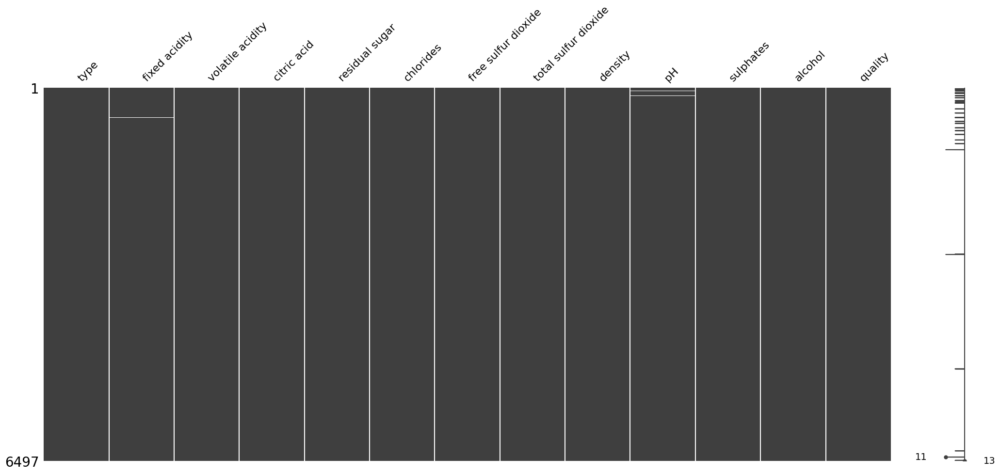

In [20]:
import missingno as msno
msno.matrix(vinos)

<Axes: >

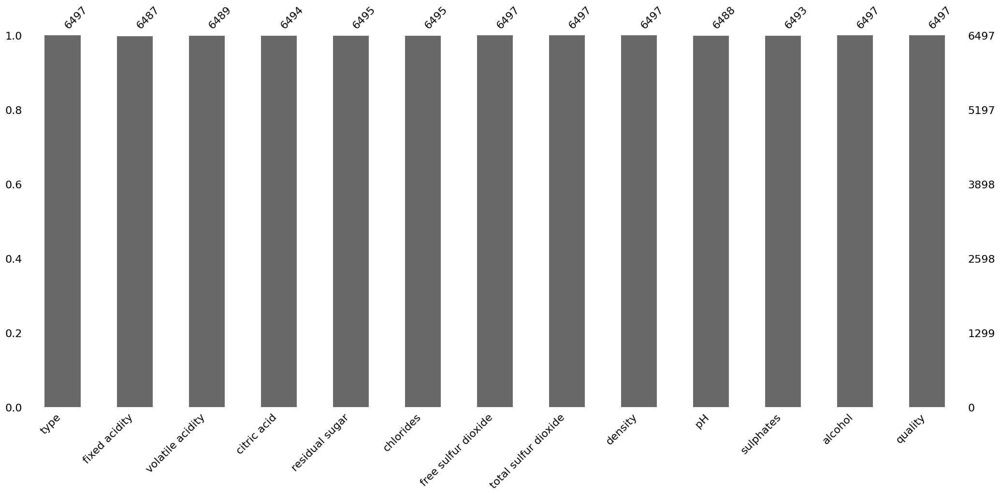

In [21]:
msno.bar(vinos)

Quitamos los registros que tienen datos faltantes y verificamos que nuestra base de datos esta ahora completa.

In [22]:
vinos= vinos.dropna()
vinos.isnull().sum()

type                    0
fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [23]:
sum(vinos.isnull().sum())


0

Valores duplicados

In [24]:
print(vinos.shape)
vinos=vinos.drop_duplicates()
print(vinos.shape)

(6463, 13)
(5295, 13)


Entonces obtenemos nuestra base de datos limpia.

In [25]:
vinos

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
6,white,6.2,0.320,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6490,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6491,red,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


## **Obtención de Insights sobre nuestro conjunto de datos**

In [26]:
vinos.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,5295.0,7.218008,1.320690,3.80000,6.4000,7.00000,7.70000,15.90000
volatile acidity,5295.0,0.344021,0.168237,0.08000,0.2300,0.30000,0.41000,1.58000
citric acid,5295.0,0.318782,0.147112,0.00000,0.2400,0.31000,0.40000,1.66000
residual sugar,5295.0,5.051029,4.500641,0.60000,1.8000,2.70000,7.50000,65.80000
chlorides,5295.0,0.056690,0.036901,0.00900,0.0380,0.04700,0.06600,0.61100
free sulfur dioxide,5295.0,30.046837,17.827151,1.00000,16.0000,28.00000,41.00000,289.00000
total sulfur dioxide,5295.0,114.118225,56.787187,6.00000,74.0000,116.00000,154.00000,440.00000
density,5295.0,0.994536,0.002969,0.98711,0.9922,0.99467,0.99678,1.03898
pH,5295.0,3.224385,0.160155,2.72000,3.1100,3.21000,3.33000,4.01000
sulphates,5295.0,0.533199,0.149851,0.22000,0.4300,0.51000,0.60000,2.00000


In [27]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip --no-cache-dir

     \ 17.8 MB 38.3 MB/s 0:00:01
  Preparing metadata (setup.py) ... done


In [28]:
import ydata_profiling

In [29]:
from ydata_profiling import ProfileReport

In [30]:
profile = ProfileReport(vinos,title='prueba')

In [31]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##**Propuesta del primer algoritmo de Machine Learning**


Recordamos que este proyecto es un problema de clasificación, por lo tanto aplicaremos un modelo de machine learning.

In [32]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [33]:
vinos.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
6,white,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6


In [34]:
vinos.quality.unique()

array([6, 5, 7, 8, 4, 3, 9])

Los posibles valores de clasificación para la calidad de los vinos va del 3 al 9.

Text(0.5, 1.0, 'Vinos')

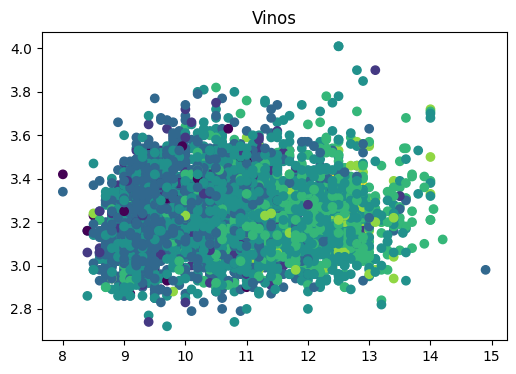

In [35]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize= (6,4))
ax.scatter(vinos.alcohol, vinos.pH, c= vinos.quality);
ax.set_title("Vinos")

In [36]:
X = vinos.drop(columns =['type','quality']) # Matriz de 2 columnas -Variable Independientes
y = vinos['quality'] # Vector de 200 filas y 1 columa- Variable Dependiente

In [37]:
y.values.reshape(-1,1)

array([[6],
       [6],
       [6],
       ...,
       [5],
       [5],
       [6]])

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X,y.values.reshape(-1,1),train_size= 0.75,\
                                                    random_state = 42,shuffle=True)

In [74]:
# Creación del modelo SVM
modelo1 = SVC(C=0.1,kernel='rbf',random_state=42)
modelo1.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(C=0.1, random_state=42)

In [75]:
#Predicciones!
#y_train_pred = modelo.predict(X_train)
y_test_pred = modelo1.predict(X_test)

In [76]:
X_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
516,6.8,0.18,0.37,1.6,0.055,47.0,154.0,0.99340,3.08,0.45,9.100000
1320,7.6,0.19,0.42,1.5,0.044,6.0,114.0,0.99140,3.04,0.74,12.800000
983,5.7,0.36,0.34,4.2,0.026,21.0,77.0,0.99070,3.41,0.45,11.900000
4380,5.7,0.31,0.29,7.3,0.050,33.0,143.0,0.99332,3.31,0.50,11.066667
6362,6.8,0.59,0.10,1.7,0.063,34.0,53.0,0.99580,3.41,0.67,9.700000
...,...,...,...,...,...,...,...,...,...,...,...
4576,5.9,0.30,0.29,1.1,0.036,23.0,56.0,0.99040,3.19,0.38,11.300000
1275,6.2,0.22,0.27,1.5,0.064,20.0,132.0,0.99380,3.22,0.46,9.200000
1019,8.3,0.14,0.26,1.5,0.049,56.0,189.0,0.99460,3.21,0.62,9.500000
3771,6.1,0.27,0.28,9.8,0.042,61.0,125.0,0.99532,3.14,0.42,10.200000


In [77]:
y_test_pred

array([6, 6, 6, ..., 6, 6, 6])

In [78]:
#Calculo el accuracy en Test
from sklearn.metrics import accuracy_score
test_accuracy = accuracy_score(y_test, y_test_pred)
print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.4003021148036254


Con el primero modelo SVC (C-Support Vector Classification) obtenmos una precisión de aciertos del 40%.

##**Segundo modelo de Machine Learning**

Usaremos un segundo modelo de Machine Learning

In [44]:
from sklearn.tree import DecisionTreeClassifier

In [79]:
modelo2 = DecisionTreeClassifier(random_state = 42)

In [80]:
modelo2.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [82]:
#Predicciones!
#y_train_pred = modelo.predict(X_train)
y_test_pred2 = modelo2.predict(X_test)

In [85]:
test_accuracy = accuracy_score(y_test, y_test_pred2)
print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.44637462235649544


Con el modelo SVC tenemos un 40% de aciertos y con clasificador de árbol de decisión tenemos 45%. Vemos que tenemos un aumento de 5% en la efectividad de aciertos.

##**Desafio CrossValidation de modelos de Machine Learning**

In [49]:
from sklearn.model_selection import cross_val_score


In [50]:
import numpy as np

In [92]:
scores = cross_val_score(modelo1, X, y, scoring = 'accuracy', cv = 5)
print(scores.mean())

0.4100094428706327


In [93]:
scores = cross_val_score(modelo2, X, y, scoring = 'accuracy', cv = 5)
print(scores.mean())

0.3979225684608121


Utilizamos la métrica de clasificación classification_report de la paquetería sklearn.


In [96]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00        13
           4       0.00      0.00      0.00        60
           5       0.00      0.00      0.00       466
           6       0.40      1.00      0.57       530
           7       0.00      0.00      0.00       211
           8       0.00      0.00      0.00        43
           9       0.00      0.00      0.00         1

    accuracy                           0.40      1324
   macro avg       0.06      0.14      0.08      1324
weighted avg       0.16      0.40      0.23      1324



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Vemos que el primer modelo tiene mala precisión en los valores a excepción del valor central en un rango de calificación en la calidad del vino de 6 donde el 40 porciento de las predicciones positivas con correctas con relación a las predicciones positivas.



In [104]:
print(classification_report(y_test, y_test_pred2))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00        13
           4       0.15      0.13      0.14        60
           5       0.54      0.51      0.53       466
           6       0.46      0.49      0.48       530
           7       0.37      0.38      0.37       211
           8       0.14      0.12      0.13        43
           9       0.00      0.00      0.00         1

    accuracy                           0.45      1324
   macro avg       0.24      0.23      0.23      1324
weighted avg       0.44      0.45      0.44      1324



Por otro lado tenemos que el segundo modelo de árbol de decisión tenemos mejores porcentajes. El mas destacado es la precision de los vinos con calidad 5 y 6 teniendo un 54% y un 46% respectivamente.

Existen varios modelos aplicables para datos de clasificación, probaremos otros 3 buscando tengan un mejor desempeño.

In [54]:
from sklearn.linear_model import LogisticRegression as LR
from sklearn.neighbors import KNeighborsClassifier as KNC
from sklearn.ensemble import AdaBoostClassifier as ABC
from sklearn.ensemble import ExtraTreesClassifier as ETC
from sklearn.ensemble import RandomForestClassifier as RFC
from sklearn.ensemble import GradientBoostingClassifier as GBC
from sklearn.neural_network import MLPClassifier as MLP
from sklearn.model_selection import GridSearchCV as GSC

In [86]:
modelo3 = KNC(n_neighbors=3)
modelo3.fit(X_train, y_train)
scores = cross_val_score(modelo3, X, y, scoring = 'accuracy', cv = 5)
print(scores.mean())

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


0.3741265344664778


In [87]:
modelo4 = ABC(n_estimators=100, random_state=0)
modelo4.fit(X_train, y_train)
scores = cross_val_score(modelo4, X, y, scoring = 'accuracy', cv = 5)
print(scores.mean())

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.3425873465533522


In [88]:
modelo5 = MLP(random_state=1, max_iter=300)
modelo5.fit(X_train, y_train)
scores = cross_val_score(modelo5, X, y, scoring = 'accuracy', cv = 5)
print(scores.mean())

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1098: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.49688385269121815


In [100]:
y_test_pred3 = modelo3.predict(X_test)
y_test_pred4 = modelo4.predict(X_test)
y_test_pred5 = modelo5.predict(X_test)

In [106]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_test_pred3))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00        13
           4       0.13      0.17      0.15        60
           5       0.42      0.44      0.43       466
           6       0.44      0.52      0.48       530
           7       0.30      0.18      0.22       211
           8       0.00      0.00      0.00        43
           9       0.00      0.00      0.00         1

    accuracy                           0.40      1324
   macro avg       0.18      0.19      0.18      1324
weighted avg       0.38      0.40      0.38      1324



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [105]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_test_pred4))

              precision    recall  f1-score   support

           3       0.01      0.54      0.03        13
           4       0.00      0.00      0.00        60
           5       0.39      0.12      0.19       466
           6       0.46      0.52      0.49       530
           7       0.40      0.09      0.15       211
           8       0.00      0.00      0.00        43
           9       0.00      0.00      0.00         1

    accuracy                           0.27      1324
   macro avg       0.18      0.18      0.12      1324
weighted avg       0.39      0.27      0.29      1324



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [102]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_test_pred5))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00        13
           4       0.57      0.07      0.12        60
           5       0.64      0.42      0.51       466
           6       0.47      0.70      0.56       530
           7       0.41      0.42      0.41       211
           8       0.00      0.00      0.00        43
           9       0.00      0.00      0.00         1

    accuracy                           0.50      1324
   macro avg       0.30      0.23      0.23      1324
weighted avg       0.50      0.50      0.47      1324



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


El modelo MLP (Multi-layer Perceptron classifier) parece ser el mejor de los 5 modelos teniendo buena respuesta para los valores de calidad del rango 4 - 7.

##**Conclusión**

Como vemos hemos hecho una investigación de esta base de datos sobre vinos llegando a la conclusión de que la información de las propiedades fisico-química obtenidas de las muestras de vinos estan relacionadas entre si, sin embargo no son las mejores para poder determinar la calidad del vino de manera muy eficiente.